# Рынок заведений общественного питания Москвы

Описание проекта:

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.
Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

План исследования:

1. Загрузите данные и изучите общую информацию.
2. Анализ данных:
- Какие категории заведений представлены в данных? Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.
- Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Проанализируйте результаты и сделайте выводы.
- Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?
- Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.
- Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся? Отобразите общее количество заведений и количество заведений каждой категории по районам.
- Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.
- Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?
- Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. 
- Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.
- Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам.
- Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?
3. Исследование: открытие кофейни.
4. Подготовка перезентации.
5. Вывод.

Описание данных:

Файл moscow_places.csv:
- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона;
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill;
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill;
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки);
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.

## Ознакомление с датафреймом.

Импортируем библиотеки и читам данные датафрейма.

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
sns.set(rc={'figure.figsize':(10, 8)})
from matplotlib import pyplot as plt
import plotly.express as px
from plotly import graph_objects as go
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster

import warnings
warnings.filterwarnings('ignore')

In [2]:
data = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')

Выводим типы столбцов и ознакамливаемся с датафреймом

In [3]:
data.info()
data.head(5)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
data.shape

(8406, 14)

## Подготовим данные.

### Переименуем значения в столбцах.

Изменим значения в столбце `chain` на читаемый вид.

In [5]:
data['chain'] = data['chain'].map({0:'несетевое', 1:'сетевое'})

In [6]:
data['chain'].value_counts()

несетевое    5201
сетевое      3205
Name: chain, dtype: int64

### Проверим пропуски.

In [7]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Имеются пропуски, но их мы не можем заполнить, поэтому оставляем как есть.

### Проверим дубликаты.

In [8]:
data.duplicated().sum()

0

In [9]:
data['address'].duplicated().sum()

2653

In [10]:
data['name'].duplicated().sum()

2792

Имеются дубликаты по адресам и названиям заведений - скорее всего это сетевые заведения расположенные по разным адресам и очевидно есть места, где на одном адресе несколько и более общепитов. Поэтому дубликаты не имеет смысла удалять.

Приведём названия заведений и адреса к нижнему регистру.

### Проверим аномальные значения.

In [11]:
data.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1288.000000


В целом аномальнымх значений не замечено. Есть места, где средний чек выглядит странным, но места бывают разные по ценновому диапазону. Также есть заведения с аномально большим количеством мест, но вдруг это 'Food-Court', где места могут быть общие.

### Избавимся от неявных дубликатов.

Избавимся от дубликатов "Яндекс".

In [12]:
data.query('name == "Яндекс Лавка"').info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 69 entries, 162 to 7980
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               69 non-null     object 
 1   category           69 non-null     object 
 2   address            69 non-null     object 
 3   district           69 non-null     object 
 4   hours              68 non-null     object 
 5   lat                69 non-null     float64
 6   lng                69 non-null     float64
 7   rating             69 non-null     float64
 8   price              0 non-null      object 
 9   avg_bill           0 non-null      object 
 10  middle_avg_bill    0 non-null      float64
 11  middle_coffee_cup  0 non-null      float64
 12  chain              69 non-null     object 
 13  seats              35 non-null     float64
dtypes: float64(6), object(8)
memory usage: 8.1+ KB


In [13]:
data.query('name == "Яндекс.Лавка"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1206,Яндекс.Лавка,ресторан,"Москва, Таллинская улица, 14",Северо-Западный административный округ,"ежедневно, 07:00–00:00",55.798612,37.400494,4.1,NaN,NaN,NaN,NaN,сетевое,NaN
3107,Яндекс.Лавка,ресторан,"Москва, улица Академика Павлова, 50",Западный административный округ,"ежедневно, 07:00–00:00",55.746817,37.409400,2.8,NaN,NaN,NaN,NaN,сетевое,NaN
5201,Яндекс.Лавка,ресторан,"Москва, улица Большие Каменщики, 9сИ",Центральный административный округ,"ежедневно, 07:00–02:00",55.738444,37.655364,3.5,NaN,NaN,NaN,NaN,сетевое,NaN


In [14]:
data['name'] = data['name'].str.replace('.', ' ')

In [15]:
data.query('name == "Яндекс Лавка"').info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 72 entries, 162 to 7980
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               72 non-null     object 
 1   category           72 non-null     object 
 2   address            72 non-null     object 
 3   district           72 non-null     object 
 4   hours              71 non-null     object 
 5   lat                72 non-null     float64
 6   lng                72 non-null     float64
 7   rating             72 non-null     float64
 8   price              0 non-null      object 
 9   avg_bill           0 non-null      object 
 10  middle_avg_bill    0 non-null      float64
 11  middle_coffee_cup  0 non-null      float64
 12  chain              72 non-null     object 
 13  seats              35 non-null     float64
dtypes: float64(6), object(8)
memory usage: 8.4+ KB


Приведём названия заведений и адреса к нижнему регистру.

In [16]:
data['name'] = data['name'].str.lower()
data['address'] = data['address'].str.lower()

In [17]:
(data.duplicated(subset=['name', 'address'], keep='last')).value_counts()

False    8402
True        4
dtype: int64

In [18]:
data = data.drop_duplicates(subset=['name', 'address'], keep='last')
(data.duplicated(subset=['name', 'address'], keep='last')).value_counts()

False    8402
dtype: int64

### Создадим столбец `street` с названиями улиц.

In [19]:
new_col = data['address'].str.split(',', n=6, expand=True)
data['street'] = new_col[1]

In [20]:
data.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,несетевое,NaN,улица дыбенко
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,несетевое,4.0,улица дыбенко
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,несетевое,45.0,клязьминская улица
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,несетевое,NaN,улица маршала федоренко
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,сетевое,148.0,правобережная улица


### Создадим столбец `is_24/7` с обозначением, что заведение работает 24/7.

In [21]:
data['is_24/7'] = np.where(data['hours'] == "ежедневно, круглосуточно", True, False)
data['is_24/7'].value_counts()

False    7672
True      730
Name: is_24/7, dtype: int64

### Подитог:
Датафрейм не подлежал какому-либо кардинальному изменению по типам столбцов или удалению пропусков. Были проделаны следующие шаги:
- проверены пропуски - их мы не можем заполнить, поэтому оставляем как есть;
- проверены дубликаты - они есть, но очевидно, что это сетевые названия и повторяющиеся названия улиц;
- проверены аномальные значения;
- избавились от неявных дубликатов;
- создали отдельный столбец `street` с названиями улиц;
- создали отдельный столбец `is_24/7` с обозначением круглосуточной работы заведения.

## Анализ данных

### Какие категории заведений представлены в данных?

In [22]:
# строим столбчатую диаграмму 
fig = px.bar(data.groupby('category')['name'].count().sort_values(ascending=True).reset_index(), # загружаем данные
             x='name', # указываем столбец с данными для оси X
             y='category', # указываем столбец с данными для оси Y
             text='name' # добавляем аргумент, который отобразит текст с информацией
            )
# оформляем график
fig.update_layout(title='Категории заведений общественного питания',
                   xaxis_title='Количество заведений',
                   yaxis_title='Тип заведения')
fig.show() # выводим график

Из заведений общественного питания лидирует с большим отрывом - **кафе, рестораны, кофейни**. Замыкает рейтинг по количеству **столовая и булочная**.

### Исследуем количество посадочных мест в разных заведениях.

In [23]:
# строим столбчатую диаграмму 
fig = px.bar(data.groupby('category')['seats'].sum().sort_values(ascending=True).reset_index(), # загружаем данные
             x='seats', # указываем столбец с данными для оси X
             y='category', # указываем столбец с данными для оси Y
             text='seats' # добавляем аргумент, который отобразит текст с информацией
            )
# оформляем график
fig.update_layout(title='Количество мест заведений общественного питания',
                   xaxis_title='Количество мест',
                   yaxis_title='Тип заведения')
fig.show() # выводим график

Из графика видно, что у нас нормальное распредление. Больше всего место в **ресторанах, кафе и кофейнях**. Меньше всего в столовых и булочных (тут понятно, что они в основном работают на вынос). Удивило, что кофейни входят в топ 3 по количеству мест, по логике бар/паб и пиццерии должны обгонять это заведение.

Так же построим ящик с усами, для визуализации мест.

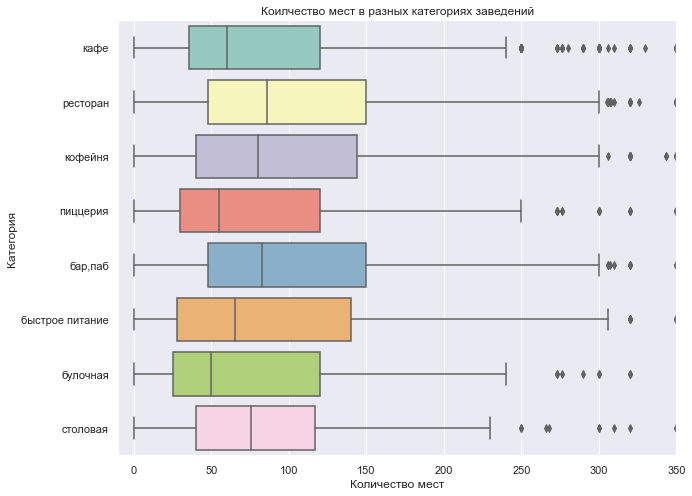

In [24]:
ax = sns.boxplot(x='seats', y='category', data=data, palette="Set3")
ax.set_xlim(-10,350)
plt.title('Коилчество мест в разных категориях заведений') # название
plt.xlabel('Количество мест') # подписи
plt.ylabel('Категория') # подписи
plt.show()

### Исследуем соотношение сетевых и несетевых заведений.

In [25]:
values = data['chain'].value_counts().to_list() # переведем в список
labels=['Несетевые', 'Сетевые'] 
fig = go.Figure(data=[go.Pie(labels=labels, values=values)]) # круговая диаграмма будет наглядна
fig.update_layout(title={'text':'Доли сетевых/несетевых заведений'},
                  width=600,
                  height=500)
fig.show()

Несетевых заведений в 1.5 раза больше.

### Какие категории заведений чаще являются сетевыми?

In [26]:
# фильтруем датафрейм по типу "сетевое" заведение
chain_catering = data.query('chain == "сетевое"').reset_index()

# создаём сводную таблица с категориями и считаем количество заведений в каждой категории
count_chain_categorys = chain_catering.pivot_table(index='category', values='name', aggfunc='count').reset_index()

# строим столбчатую диаграмму 
fig = px.bar(count_chain_categorys.sort_values(by='name', ascending=True), # загружаем данные
             x='name', # указываем столбец с данными для оси X
             y='category', # указываем столбец с данными для оси Y
             text='name' # добавляем аргумент, который отобразит текст с информацией
            )
# оформляем график
fig.update_layout(title='Количество сетевых  зведений в Москве',
                   xaxis_title='Количество заведений',
                   yaxis_title='Тип заведения')
fig.show() # выводим график

Из графика видно, что чаще всего сетевыми заведениями являются - **кафе, рестораны, кофейни**. Аутсайдерами же являются **булочные и столовые**.

In [27]:
# группируем по улице и категории заведений и считаем количество заведений
chain_unchain = data.groupby(['chain', 'category'])['name'].count().reset_index()

# строим барплот
fig = px.bar(chain_unchain.sort_values(by='name', ascending=False),
             x='chain',
             y='name',
             color='category',
             text = 'name',
             color_discrete_sequence=['#4cd137', '#AB63FA', '#FFA15A', '#19D3F3', '#FF6692', '#B6E880', '#FF97FF', '#FECB52'])
fig.update_layout(title='Количество и категории сетевы/несетвых заведений Москвы',
                  xaxis_title='Тип заведений',
                  yaxis_title='Количество заведений',
                  width=900,
                  height=850)
fig.show()

In [50]:
# строим барплот
fig = px.bar(chain_unchain.sort_values(by='name', ascending=False),
             x='name',
             y='category',
             color='chain',
             text = 'name',
             color_discrete_sequence=['#4cd137', '#AB63FA'])
fig.update_layout(title='Количество и категории сетевы/несетвых заведений Москвы',
                  xaxis_title='Количество заведений',
                  yaxis_title='Тип заведения',
                  width=900,
                  height=850)
fig.show()

### Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве.

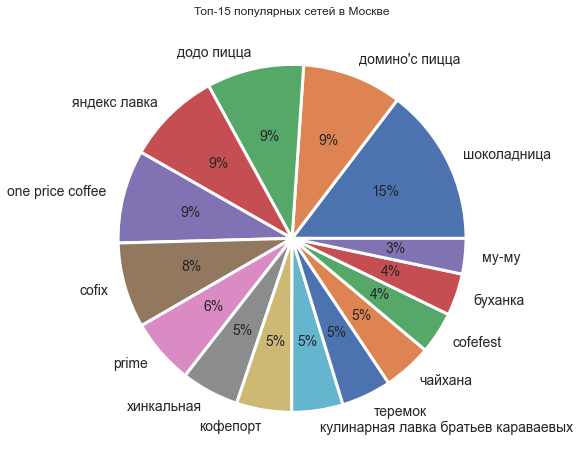

In [28]:
# делаем группировку по сетевым заведениям из переменной выше
top_15 = chain_catering.groupby('name')['name'].count().sort_values(ascending=False).head(15)
top_15.plot(y='name',
            kind='pie',
            autopct='%1.0f%%',
            label='',
            textprops={'size':'14'},
            wedgeprops={'linewidth': 3.0, 'edgecolor': 'white'},
            title = 'Топ-15 популярных сетей в Москве');

Топ-15 популярных заведений ожидаемо оказались знакомы все. В основном они попадают в категорию - **кафе, кофейня, пиццерия**. Большая часть этого топ расчитана на *быстрое питание*, т.к. Москва мегаполис с быстрым темпом жизни.

Так как много секторов и не очень удобно читать данные, то сделаем столбчатую диаграмму.

In [29]:
# строим столбчатую диаграмму 
fig = px.bar(chain_catering.groupby('name')['name'].count().sort_values(ascending=False).head(15), # загружаем данные
             x='name', # указываем столбец с данными для оси X
             text='name' # добавляем аргумент, который отобразит текст с информацией
            )
# оформляем график
fig.update_layout(title='Количество сетевых  зведений в Москве',
                   xaxis_title='Количество заведений',
                   yaxis_title='Тип заведения')
fig.show() # выводим график

### Какие административные районы Москвы присутствуют в датасете?

In [30]:
# группируем по улице и категории заведений и считаем количество заведений
district_incision = data.groupby(['district', 'category'])['name'].count().reset_index()

# строим барплот
fig = px.bar(district_incision.sort_values(by='name', ascending=False),
             x='name',
             y='district',
             color='category',
             text = 'name',
             color_discrete_sequence=['#4cd137', '#AB63FA', '#FFA15A', '#19D3F3', '#FF6692', '#B6E880', '#FF97FF', '#FECB52'])
fig.update_layout(title='Количество и категории заведений в округах',
                  xaxis_title='Количество заведений',
                  yaxis_title='Район',
                  width=1000,
                  height=600)
fig.show()

Большая часть заведений распологается в центральном административном округе Москвы. В остальных округах заведения распределены равномерно.

### Визуализируйте распределение средних рейтингов по категориям заведений.

In [31]:
# строим столбчатую диаграмму 
fig = px.bar(round((data.groupby('category')['rating'].mean().sort_values(ascending=False).reset_index()), 2), # загружаем данные
             x='category', # указываем столбец с данными для оси X
             y='rating', # указываем столбец с данными для оси Y
             text='rating' # добавляем аргумент, который отобразит текст с информацией
            )
# оформляем график
fig.update_layout(title='Рейтинг заведений общественного питания',
                   xaxis_title='Тип заведения',
                   yaxis_title='Рейтинг')
fig.show() # выводим график

Удивительно, что при усреднённом рейтинге все типы общепита находятся примерно в одном диапазоне от **4.05** до **4.39**. Лидируют бары и пабы, видимо алкоголь делает своё дело и люди охотнее ставят высокие оценки данным заведениям.

Также добавим ящики с усами для рейтингов.

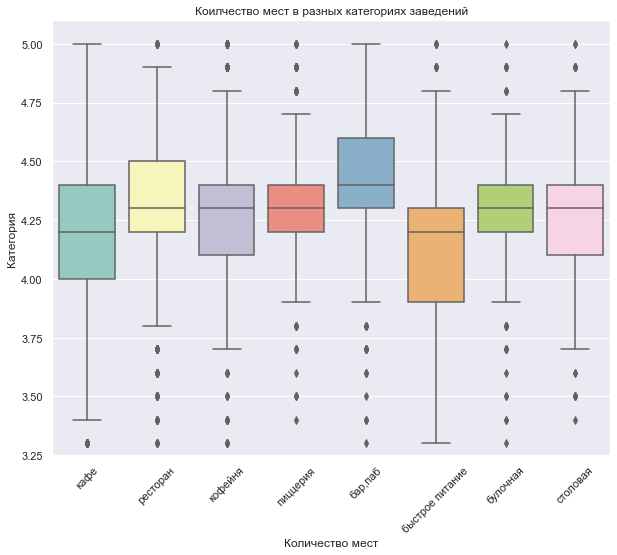

In [32]:
ax = sns.boxplot(x='category', y='rating', data=data, palette="Set3")
ax.set_ylim(3.25,5.1)
plt.title('Коилчество мест в разных категориях заведений') # название
plt.xlabel('Количество мест') # подписи
plt.ylabel('Категория') # подписи
plt.xticks(rotation=45)
plt.show()

### Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.

In [33]:
# создадим переменную со средним рейтингом заведений каждого района
data_rating = data.groupby('district', as_index=False)['rating'].agg('median')
data_rating

,district,rating
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.2
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.4
6,Юго-Восточный административный округ,4.2
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3


In [34]:
# загружаем JSON-файл с границами округов Москвы
geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo,
    data=data_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

### Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [35]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
cluster_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(cluster_map)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)
    
# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)
   
cluster_map

ЦАО является самым популярным округом Москвы по количеству заведений разных категорий.

### Найдите топ-15 улиц по количеству заведений.

In [36]:
# группируем улицы и сортируем заведения в порядке убывания
grouped_top_15 = data.groupby('street')['name'].count().sort_values(ascending=False).head(15)
# делаем список из отсортированных заведений и записываем в переменную
list_top_15 = grouped_top_15.index.values.tolist()
# делаем новый датафрейм с топ улицами из списка
df_top_15 = data.query('street in @list_top_15')

# группируем по улице и категории заведений и считаем количество заведений
top_15_streets = df_top_15.groupby(['street', 'category'])['name'].count().reset_index()

# строим барплот
fig = px.bar(top_15_streets.sort_values(by='name', ascending=False),
             x='name',
             y='street',
             color='category',
             text = 'name',
             color_discrete_sequence=['#4cd137', '#AB63FA', '#FFA15A', '#19D3F3', '#FF6692', '#B6E880', '#FF97FF', '#FECB52'])
fig.update_layout(title='Топ-15 улиц по количеству заведений с категорями',
                  xaxis_title='Количество заведений',
                  yaxis_title='Название улицы',
                  width=1020,
                  height=600)
fig.show()

### Найдите улицы, на которых находится только один объект общепита.

In [37]:
one_obj = data.groupby('street')['name'].count().reset_index()
one_obj = one_obj.query('name == 1')
one_obj['name'].agg({'min', 'max'})

max    1
min    1
Name: name, dtype: int64

Всего единичных заведений на улицу - **458 штук**. Возможно, эти улицы очень малы (по расстоянию) и большое количество заведений там нельзя расположить. Либо мало зданий под сдачу для общепита. Также может быть очень дорогая аренда и маленькое помещение, тобишь большой ресторан/кафе не откроешь, а кофейня с арендой превышающую выручку никому не нужна.

### Посчитаем медианное значение чека для каждого района.

In [38]:
# считаем медианное значение среднего чека для каждого округа
mean_avg_bill = data.groupby('district')['middle_avg_bill'].median().reset_index()
mean_avg_bill

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [39]:
# загружаем JSON-файл с границами округов Москвы
geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
mean_avgbill_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo,
    data=mean_avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианное значение чека для каждого района',
).add_to(mean_avgbill_map)

# выводим карту
mean_avgbill_map

Исходя из графки видно, что в Центральном и Западном округах медианное значение среднего чека находится на отметке **1000 р.** Удалённость на север или юг сопровождается уменьшением медианы среднего чека и составляет около **450 р.** Остальные округа находятся в среднем ценовом диапазоне **550 - 720 р.**

### Подитог.

- В данных представлены 8 категорий заведений - **кафе, ресторан, кофейня, пиццерия, бар/паб, быстрое питание, булочная, столовая**. Больше всего заведений из категории - **кафе, рестораны, кофейни**.

- Большая часть посадочных мест приходится на категории **ресторан, кафе, кофейня** - данные места ориентированы на большие встречи/мероприятия, поэтому места куда больше, чем в других заведениях.

- Большая доля на рынке приходится на несетевые заведения - оно и не удивительно, сейчас эра предпринимательства и развития, несмотря на все сложности ведения бизнеса.

- Чаще всего сетевыми заведениями являются **кафе, рестораны, кофейни.**

- Самыми популярные заведениями оказались **кафе, кофейни и пиццерии**. Упор сделан на фаст-фуд, чтоб не тратить сильно много времени на перекусы.

- В Москве всего 9 административных округов:
    - Восточный административный округ
    - Западный административный округ
    - Северный административный округ
    - Северо-Восточный административный округ
    - Северо-Западный административный округ
    - Центральный административный округ
    - Юго-Восточный административный округ
    - Юго-Западный административный округ
    - Южный административный округ	
    
- Все общепиты находятся примерно в одном рейтинговом диапазоне - **4.05 до 4.39.**

- В центре рейтинг мест питания самый высокий - дорогая аренда, требуется делать качественный продукт, чтоб люди приходили и бизнес окупался, вот залог успеха.

- Топ 15 улиц по количеству заведений в Москве - *Варшавское шоссе, Дмитровское шоссе, Каширское шоссе, Кутузовский проспек, Ленинградский проспект, Ленинградское шоссе, Ленинский проспект, Люблинская улица, МКАД, Профсоюзная улица, Пятницкая улица, проспект Вернадского, проспект Мира, улица Вавилова, улица Миклухо-Маклая.*

- Интересно, что имеется 458 улиц, где количество заведений общественного питания равняется **1.**

- В центрально и Западном округах медианное значение среднего чека равняется **1000 р.** На севере и юге средний примерно **450 р.** и в остальных округах он колеблется в диапазоне **550 - 720 р.**

## Исследование возможности открытия кофейни.

In [40]:
# создадим отдельную переменную с кофейнями
coffee_shop = data.query('category == "кофейня"')
# переменная с группировкой кофеен по округам
coffee_shop_districts = coffee_shop.groupby('district')['name'].count()
# количество круглосуточных кофеен
coffee_shop_daynight = coffee_shop.query('hours == "ежедневно, круглосуточно"')
coffee_shop_daynight = coffee_shop_daynight.groupby('district')['name'].count().reset_index()
# переменная со средним рейтингом кофеен по районам
coffee_shop_rating = round(coffee_shop.groupby('district')['rating'].mean().reset_index(), 2)

In [41]:
print(
'В датасете всего %s кофеен. Из них в режим 24/7 работает %s заведений.' % (len(coffee_shop), coffee_shop_daynight['name'].sum())
)


В датасете всего 1413 кофеен. Из них в режим 24/7 работает 59 заведений.


Построим карту с рейтингом кофеен и количеством их по округам.

In [42]:
# загружаем JSON-файл с границами округов Москвы
geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
coffee_cluster_rating_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo,
    data=coffee_shop_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.4,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(coffee_cluster_rating_map)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(coffee_cluster_rating_map)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['district']}",
    ).add_to(marker_cluster)
    
# применяем функцию create_clusters() к каждой строке датафрейма
coffee_shop.apply(create_clusters, axis=1)
   
coffee_cluster_rating_map

Сделаем отдельную карту со средней ценой за чашку кофе.

In [43]:
avg_coffee_cup = round(
    coffee_shop.groupby('district')['middle_coffee_cup']
    .mean().reset_index()
    .sort_values(by='middle_coffee_cup', ascending=False))
avg_coffee_cup

,district,middle_coffee_cup
1,Западный административный округ,190.0
5,Центральный административный округ,188.0
7,Юго-Западный административный округ,184.0
0,Восточный административный округ,174.0
2,Северный административный округ,166.0
4,Северо-Западный административный округ,166.0
3,Северо-Восточный административный округ,165.0
8,Южный административный округ,158.0
6,Юго-Восточный административный округ,151.0


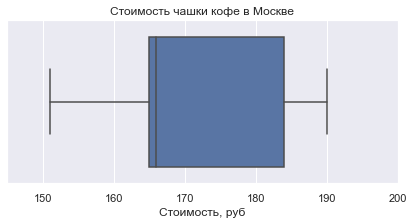

In [44]:
plt.figure(figsize=(7, 3)) # размеры графика
sns.boxplot(x='middle_coffee_cup', data=avg_coffee_cup) # боксплот
plt.xlim(145,200)
plt.title('Стоимость чашки кофе в Москве') # название
plt.xlabel('Стоимость, руб') # подписи
plt.show()

In [45]:
# загружаем JSON-файл с границами округов Москвы
geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
avg_coffee_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo,
    data=avg_coffee_cup,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.6,
    legend_name='Средняя стоимость чашки кофе по районам',
).add_to(avg_coffee_map)

# выводим карту
avg_coffee_map

Рекомендации:

Взглянув на карту с "медианным рейтингом заведений" и количество кофеен по округам можно сделать вывод, что лучше всего открыть кофейню на Юге/Юго-Востоке Москвы в районе - **Парк Кузьминки или Парк Царицино**. 

Почему именно эти районы? - Ответ прост, количество заведений сильно меньше, чем в остальных районах, а проходимость людей высокая, т.к. парк это место для свиданий, семейного препровождения времени и просто место отдыха, подумать о разных мыслях наедине с самим собой, а тёплый кофе поможет согреться в прохладное время года и окутает уютом. 
Медианные оценки заведений находятся на отметке **4.20**, следовательно, если качественно проработать интерьер, подобрать проходимое место и с ответственностью подойти к всей организации заведения, то можно завоевать хорошие оценки и со временем увеличить средний чек. Главная задача на начальном этапе заинтересовать людей, показать им качество обслуживания и продукта.

Также хочется отметить среднюю цену за чашку кофе в рекомендованных районах Москвы - цена варируется **от 150 до 165 рублей**. Данный диапазон позволяет сделать скидки на первое время, чтоб увеличить охват + поможет привлечь внимание к заведению. Дальше дело за малым - поддерживать уровень заведения и акции для клиентов, если место будет успешным, то можно уже задуматься о франшизе, а дальше - больше. 

Открытие кофеен с хорошим уровнем обслуживания - очень перспективный бизнес, т.к. средний чек на кофе и рейтинг по Москве позволяет захватить этот рынок и радовать людей согревающим напитком.

## Презентация

[Ссылка на презентацию (гугл диск)](https://drive.google.com/file/d/1-YWrj0XwAreHZZ2x4JqznYc1w1kMWdsg/view?usp=sharing)

## Выводы:

1. Из заведений общественного питания лидирует с большим отрывом - **кафе, рестораны, кофейни**. Остальные заведения находятся примерно в одном диапазоне.

2. По количеству мест также ведут заведения с категорями - **кафе, рестораны, кофейни**.

3. Несетевых заведений в Москве в **1.5 раза** больше, чем сетевых.

4. Топ популярных мест по категориям занимают - **кафе, кофейни, пиццерии**.

5. Средний рейтинг всех заведений в Москве находится на отметке **4.3**.

6. Средний чек заведений Москвы варируется **от 450 до 1000 рублей**.

7. Лучше всего открыть кофейню в районе **Парк Кузьминки или Парк Царицино**. Средний рейтинг там ниже всего, значит можно будет удивить людей интересной идеей либо интерьером. Средних чек на кофе так же являетяс самым низким по Москве, следовательно можно сделать ценник чуть ниже, чтоб набрать себе аудиторию и хорошие оценки.